<a href="https://colab.research.google.com/github/Manos-Mak120/-/blob/Wordclouds/TRUMP_ATHENS_VOICE_TEASERS_WORDCLOUD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

import time
import random

from tqdm import tqdm

In [ ]:
def get_webpage_soup(url):
  headers = {
        "User-Agent": "Mozilla/5.0"
    }
  response = requests.get(url, headers=headers)
  if response.status_code != 200:
    return None
  else:
    return BeautifulSoup(response.text, 'html.parser')

In [ ]:
def get_article_elements_from_soup(soup,article_url):
    # title
    try:
        title = soup.find("h1").text.strip()
    except:
        title = ""

    # datetime
    try:
        datetime_str = soup.find("time")["datetime"]
        date_str = datetime_str.split("T")[0]
        time_str = datetime_str.split("T")[1].split("+")[0]
    except:
        date_str = ""
        time_str = ""

    # section
    try:
        section_div = soup.find("div", class_="main-category-block") or soup.find("div", class_="main-category")
        section = section_div.text.strip() if section_div else ""
    except:
        section = ""

    # author
    try:
      author_tag = soup.find("a", class_="author-name") or soup.find("span", class_="author-name")
      author = author_tag.text.strip() if author_tag else ""
    except:
        author = ""
    # excerpt
    try:
        excerpt_div = soup.find("div", class_="p.main-intro") or soup.find(itemprop="description") or soup.find("div", class_="nx-excerpt")
        excerpt = excerpt_div.text.strip() if excerpt_div else ""
    except:
        excerpt = ""

    # text body
    try:
      content_div = soup.find("div", class_="main-text story-fulltext")
      elements = content_div.find_all(["p", "h2", "h3", "ul", "ol", "li"]) if content_div else []
      text_body = " ".join(el.get_text(strip=True) for el in elements if el.get_text(strip=True))
    except:
        text_body = ""

    # feature image
    try:
        img_block = soup.find("div", class_="article-image") or soup.find("figure")
        feat_img_link = img_block.find("img")["src"] if img_block and img_block.find("img") else ""
    except:
        feat_img_link = ""

    # image caption
    try:
        caption_div = soup.find("div", class_="image-caption") or soup.find("figcaption")
        image_caption = caption_div.text.strip() if caption_div else ""
    except:
        image_caption = ""

    articleD = {
        "article_url": article_url,
        "title": title,
        "date": date_str,
        "time": time_str,
        "section": section,
        "author": author,
        "excerpt": excerpt,
        "text_body": text_body,
        "feat_img_link": feat_img_link,
        "feat_img_cation": image_caption
    }

    return articleD

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
trump_df = pd.read_csv("/content/drive/MyDrive/Athens.voice/Scrapper/_trump_athens_voices_df.csv")

In [ ]:
trump_df

,title,article_url,date,time,author,excerpt,section
0,Ντόναλντ Τραμπ και Έλον Μασκ: Οι 10 ημέρες που...,https://www.athensvoice.gr/epikairotita/diethn...,2025-06-07,06:01:52,Newsroom,ΗΠΑ: Πώς η σχέση Τραμπ - Μασκ κατέρρευσε σε 10...,Κοσμος
1,Ο Τραμπ προσέφυγε στο Ανώτατο Δικαστήριο για ν...,https://www.athensvoice.gr/epikairotita/diethn...,2025-06-06,16:48:00,Newsroom,Το κλείσιμο του υπουργείου Παιδείας ήταν εδώ κ...,Κοσμος
2,Tesla: Κατάρρευση μετοχών εν μέσω της διαμάχης...,https://www.athensvoice.gr/epikairotita/diethn...,2025-06-06,13:41:00,Newsroom,Η μετοχή της Tesla κατέρρευσε λόγω της διαμάχη...,Κοσμος
3,Απόλυτο διαζύγιο: Η θεαματική κατάρρευση της σ...,https://www.athensvoice.gr/epikairotita/diethn...,2025-06-06,09:19:54,Newsroom,"Η συμμαχία Τραμπ-Μασκ διαλύεται θεαματικά, φέρ...",Κοσμος
4,Ο Τραμπ είχε ταξιδέψει τουλάχιστον 7 φορές με ...,https://www.athensvoice.gr/epikairotita/diethn...,2025-06-06,06:57:33,Newsroom,Ο Τραμπ είχε ταξιδέψει τουλάχιστον 7 φορές με ...,Κοσμος
...,...,...,...,...,...,...,...
995,Ρόμπερτ Κένεντι Τζούνιορ: Υποψήφιος υπουργός Υ...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,21:11:00,Newsroom,Ρόμπερτ Κένεντι Τζούνιορ: Φαβορί για υπουργός ...,Κοσμος
996,Τραμπ και Μπάιντεν φίλοι για πάντα μέσω AI - Τ...,https://www.athensvoice.gr/viral/trending-now/...,2024-11-14,16:22:05,Newsroom,Τραμπ και Μπάιντεν - Το viral βίντεο που δημιο...,Trending Now
997,Mατ Γκετζ: Ο υπουργός Δικαιοσύνης που έχει ερε...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,15:24:43,Newsroom,Ματ Γκετζ: Ποιος είναι ο αμφιλεγόμενος υπουργό...,Κοσμος
998,Δήμαρχος Λονδίνου: Ο Τραμπ με στοχοποίησε λόγω...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,15:07:29,Newsroom,Ο δήμαρχος του Λονδίνου Σαντίκ Καν κατηγορεί τ...,Κοσμος


In [ ]:
trump_df.dtypes

,0
title,object
article_url,object
date,object
time,object
author,object
excerpt,object
section,object


In [ ]:
# Convert the 'date' column to datetime objects
# Changed the format string to '%Y-%m-%d' to match the 'YYYY-MM-DD' format
trump_df['date'] = pd.to_datetime(trump_df['date'], format='%Y-%m-%d')
trump_df.dtypes

,0
title,object
article_url,object
date,datetime64[ns]
time,object
author,object
excerpt,object
section,object


In [ ]:
# Convert 'title' and 'excerpt' columns to string type and fill potential NaNs with empty strings
trump_df['title'] = trump_df['title'].astype(str).fillna('')
trump_df['excerpt'] = trump_df['excerpt'].astype(str).fillna('')

# Now apply the aggregation to join the columns
trump_df["text"] = trump_df[['title', 'excerpt']].agg('. '.join, axis=1)  #axis=1 γίνεται σε όλα τα rows axis=0 σε στηλες
trump_df.loc[0, 'text']

'Ντόναλντ Τραμπ και Έλον Μασκ: Οι 10 ημέρες που διέλυσαν τη σχέση τους. ΗΠΑ: Πώς η σχέση Τραμπ - Μασκ κατέρρευσε σε 10 ημέρες, με αφορμή το νομοσχέδιο για τις δαπάνες - Η δημόσια ρήξη, οι αλληλοκατηγορίες και οι απειλές'

In [ ]:
short_df = trump_df[['date', 'text']]
short_df.head()

,date,text
0,2025-06-07,Ντόναλντ Τραμπ και Έλον Μασκ: Οι 10 ημέρες που...
1,2025-06-06,Ο Τραμπ προσέφυγε στο Ανώτατο Δικαστήριο για ν...
2,2025-06-06,Tesla: Κατάρρευση μετοχών εν μέσω της διαμάχης...
3,2025-06-06,Απόλυτο διαζύγιο: Η θεαματική κατάρρευση της σ...
4,2025-06-06,Ο Τραμπ είχε ταξιδέψει τουλάχιστον 7 φορές με ...


In [ ]:
# Add year, month, and day columns to the biden_21 DataFrame
trump_df['year'] = pd.DatetimeIndex(trump_df['date']).year
trump_df['month'] = pd.DatetimeIndex(trump_df['date']).month
trump_df['day'] = pd.DatetimeIndex(trump_df['date']).day

# Now the filtering will work
trump_nov_jan_teasers = trump_df[
    (trump_df['month'] == 11) |
    (trump_df['month'] == 12) |
    (trump_df['month'] == 1)  |
    (trump_df['month'] == 2) |
    (trump_df["month"] == 3) |
    (trump_df["month"] == 4)
]
trump_nov_jan_teasers

,title,article_url,date,time,author,excerpt,section,text,year,month,day
186,«Σχέδιο Β» από τις Βρυξέλλες σε περίπτωση που ...,https://www.athensvoice.gr/epikairotita/diethn...,2025-04-30,19:50:02,Newsroom,Συνεχίζονται οι συνομιλίες με την Ουάσινγκτον ...,Κοσμος,«Σχέδιο Β» από τις Βρυξέλλες σε περίπτωση που ...,2025,4,30
187,Αιχμές Τραμπ προς Κίνα: Τα πάει πολύ άσχημα αυ...,https://www.athensvoice.gr/epikairotita/diethn...,2025-04-30,17:51:57,Newsroom,"Τα σχόλια, έγιναν σε συνέχεια έκθεσης που δημο...",Κοσμος,Αιχμές Τραμπ προς Κίνα: Τα πάει πολύ άσχημα αυ...,2025,4,30
188,Διαμαρτυρία της Greenpeace στο γήπεδο γκολφ το...,https://www.athensvoice.gr/epikairotita/diethn...,2025-04-30,15:37:53,Newsroom,Είναι η δεύτερη φορά τους τελευταίους δύο μήνε...,Κοσμος,Διαμαρτυρία της Greenpeace στο γήπεδο γκολφ το...,2025,4,30
189,Εργατική Πρωτομαγιά 2025: 24ωρη απεργία στη Γρ...,https://www.athensvoice.gr/epikairotita/ellada...,2025-04-30,13:46:00,Newsroom,Εργατική Πρωτομαγιά 2025: 24ωρη απεργία στη Γρ...,Ελλαδα,Εργατική Πρωτομαγιά 2025: 24ωρη απεργία στη Γρ...,2025,4,30
190,Συρρικνώθηκε η οικονομία των ΗΠΑ στο πρώτο τρί...,https://www.athensvoice.gr/epikairotita/diethn...,2025-04-30,13:43:59,Newsroom,"Η οικονομία των ΗΠΑ συρρικνώθηκε 0,3% στο πρώτ...",Κοσμος,Συρρικνώθηκε η οικονομία των ΗΠΑ στο πρώτο τρί...,2025,4,30
...,...,...,...,...,...,...,...,...,...,...,...
995,Ρόμπερτ Κένεντι Τζούνιορ: Υποψήφιος υπουργός Υ...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,21:11:00,Newsroom,Ρόμπερτ Κένεντι Τζούνιορ: Φαβορί για υπουργός ...,Κοσμος,Ρόμπερτ Κένεντι Τζούνιορ: Υποψήφιος υπουργός Υ...,2024,11,14
996,Τραμπ και Μπάιντεν φίλοι για πάντα μέσω AI - Τ...,https://www.athensvoice.gr/viral/trending-now/...,2024-11-14,16:22:05,Newsroom,Τραμπ και Μπάιντεν - Το viral βίντεο που δημιο...,Trending Now,Τραμπ και Μπάιντεν φίλοι για πάντα μέσω AI - Τ...,2024,11,14
997,Mατ Γκετζ: Ο υπουργός Δικαιοσύνης που έχει ερε...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,15:24:43,Newsroom,Ματ Γκετζ: Ποιος είναι ο αμφιλεγόμενος υπουργό...,Κοσμος,Mατ Γκετζ: Ο υπουργός Δικαιοσύνης που έχει ερε...,2024,11,14
998,Δήμαρχος Λονδίνου: Ο Τραμπ με στοχοποίησε λόγω...,https://www.athensvoice.gr/epikairotita/diethn...,2024-11-14,15:07:29,Newsroom,Ο δήμαρχος του Λονδίνου Σαντίκ Καν κατηγορεί τ...,Κοσμος,Δήμαρχος Λονδίνου: Ο Τραμπ με στοχοποίησε λόγω...,2024,11,14


In [ ]:
short_dff = short_df.copy()
short_df['year'] = pd.DatetimeIndex(short_df['date']).year
short_df['month'] = pd.DatetimeIndex(short_df['date']).month
short_df['day'] = pd.DatetimeIndex(short_df['date']).day
short_df.head()

<ipython-input-45-3495311681>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['year'] = pd.DatetimeIndex(short_df['date']).year
<ipython-input-45-3495311681>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['month'] = pd.DatetimeIndex(short_df['date']).month
<ipython-input-45-3495311681>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas

,date,text,year,month,day
0,2025-06-07,Ντόναλντ Τραμπ και Έλον Μασκ: Οι 10 ημέρες που...,2025,6,7
1,2025-06-06,Ο Τραμπ προσέφυγε στο Ανώτατο Δικαστήριο για ν...,2025,6,6
2,2025-06-06,Tesla: Κατάρρευση μετοχών εν μέσω της διαμάχης...,2025,6,6
3,2025-06-06,Απόλυτο διαζύγιο: Η θεαματική κατάρρευση της σ...,2025,6,6
4,2025-06-06,Ο Τραμπ είχε ταξιδέψει τουλάχιστον 7 φορές με ...,2025,6,6


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [ ]:
short_df[short_df['month']==1]['text'] #οποιά rows έχουνε το ένα από το κεντρικό τα φέρνει

,text
689,Τραμπ: Ασφαλώς και θα επιβάλλω δασμούς στην ΕΕ...
690,Ο Τραμπ θα επιβάλει δασμούς στον Καναδά και στ...
691,Η Σελένα Γκόμεζ έχασε 800.000 followers μετά τ...
692,Μελάνια Τραμπ: Όταν υποδυόταν την Πρόεδρο των ...
693,Τραμπ 2.0 και Έλον Μασκ: Γιγαντώνοντας την Τεχ...
...,...
879,Κυκλοφοριακές ρυθμίσεις στη γραμμή 7 του τραμ ...
880,Στις 10 Ιανουαρίου η ποινή στον Ντόναλντ Τραμπ...
881,Ντόναλντ Τραμπ: Οι τρεις πολιτικές που θα εφαρ...
882,Λας Βέγκας: Στρατιώτης ο οδηγός του Cybertruck...


In [ ]:
# αν θέλουμε να δούμε ένα συγκεκριμένο κείμενο
short_df.loc[10, "text"]

'«Απογοητευμένος» ο Τραμπ για την κριτική του Μασκ: Τον έχω βοηθήσει πολύ. Ο Τραμπ δηλώνει «απογοητευμένος» από την κριτική του Μασκ για το νομοσχέδιο με τις φορολογικές ελαφρύνσεις.'

In [ ]:
jan_text = short_df[short_df['month']==1]['text'].str.cat(sep = ' ')
jan_text

'Τραμπ: Ασφαλώς και θα επιβάλλω δασμούς στην ΕΕ, μας συμπεριφέρθηκε πολύ άσχημα. Τραμπ: Ασφαλώς και θα επιβάλλω δασμούς στην ΕΕ - Η ΕΕ μας συμπεριφέρθηκε πολύ άσχημα είπε μιλώντας σε δημοσιογράφους o πρόεδρος των ΗΠΑ Ο Τραμπ θα επιβάλει δασμούς στον Καναδά και στο Μεξικό από την 1η Μαρτίου. Ο Τραμπ ξεκινάει εμπορικό πόλεμο με Μεξικό - Καναδά: Θα επιβάλει δασμούς 25% στις εισαγωγές Η Σελένα Γκόμεζ έχασε 800.000 followers μετά το βίντεο για τις απελάσεις του Τραμπ. Η Σελένα\xa0Γκόμεζ\xa0 πριν μερικές ημέρες εμφανίστηκε να κλαίει σε ένα βίντεο, αντιδρώντας στις μαζικές απελάσεις μεταναστών Μελάνια Τραμπ: Όταν υποδυόταν την Πρόεδρο των ΗΠΑ, 32 χρόνια πριν. Η Μελάνια Τράμπ εμφανίζεται\xa0στη συγκεκριμένη διαφήμιση\xa0ως η\xa0Πρώτη Γυναίκα Πρόεδρος των ΗΠΑ Τραμπ 2.0 και Έλον Μασκ: Γιγαντώνοντας την Τεχνητή Νοημοσύνη. Η γιγάντωση της Τεχνητής Νοημοσύνης, η Γενική Τεχνητή Νοημοσύνη (AGI), η Τεχνητή Υπερνοημοσύνη (Superintelligence)» στα χρόνια διακυβέρνησης Τραμπ και Μασκ. Με δασμούς 100% απει

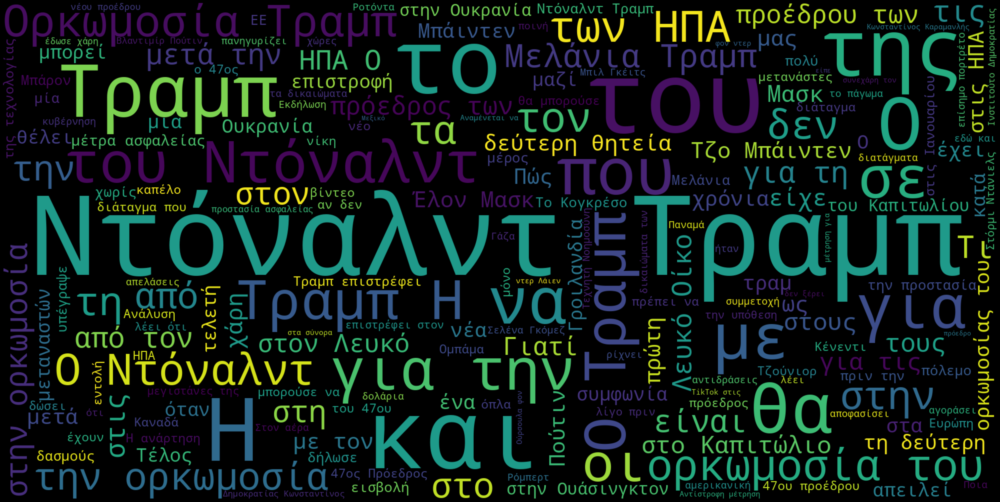

In [ ]:
wordcloud = WordCloud(  #ενώνει όλα τα κείμενα μαζί για να μας φέρει το wordcloud
    stopwords = STOPWORDS, # <- τα stopwords που θέλουμε να κοπούν
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(jan_text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής του κειμένου
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
list(STOPWORDS)[0:20] #ποιες λέξειςς δεν πρέπει να λαμβάνει υποψιν

['which',
 'his',
 'each',
 'here',
 'me',
 'he',
 'into',
 'an',
 'my',
 'however',
 "he'll",
 "i'll",
 'and',
 'below',
 "they're",
 "here's",
 'do',
 'was',
 'therefore',
 'we']

In [ ]:
import spacy

In [ ]:
# Κατέβασμα του μικρού πακέτου της ελληνικής γλώσσας, το οποίο είναι εκπαιδευμένο σε ειδησεογραφικά κείμενα.  #ΠΡΟΣΟΧΗ ΕΔΩ
!python -m spacy download el_core_news_sm

# Αν η παρακάτω εντολή δεν δουλεύει, κάνουμε Runtime ->  Restart Runtime, για να δει τις αλλαγές από το download...

  Using cached https://github.com/explosion/spacy-models/releases/download/el_core_news_sm-3.8.0/el_core_news_sm-3.8.0-py3-none-any.whl (12.6 MB)
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20]) # τα 20 πρώτα

['Ντόναλντ', 'ΤζοΚούβα', 'Τραμπ', 'άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα']


In [ ]:
# function δημιουργίας wordcloud
def create_wordcloud(text):
  wordcloud = WordCloud(
      stopwords = nlp.Defaults.stop_words, # <- τα stopwords που θέλουμε να "κοπούν"
      width = 2000,
      height = 1000,
      background_color = 'black'
  ).generate(text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής που έχουμε βάλει στα arguements που δέχεται το function
  return wordcloud

Φτιάχνω ξεχωριστό function για το wordcloud γιατί μπορεί να θέλω να δω κάτι στο wordcloud και όχι απαραίτητα να το κάνω εικόνα.

In [ ]:
wcloud = create_wordcloud(jan_text)
# το wcloud.words_ είναι ένα dictionary που τα keys είναι οι λέξεις και τα values οι συχνότητες
# βάζω τα items του dictionary σε λίστα για να μπορώ να δω μόνο ένα μέρος τους και όχι όλα
list(wcloud.words_.items())[:5]

[('ορκωμοσία', 1.0),
 ('ΗΠΑ', 0.8266666666666667),
 ('Μελάνια', 0.3466666666666667),
 ('πρόεδρος', 0.24),
 ('Καπιτώλιο', 0.18666666666666668)]

In [ ]:
# function δημιουργίας της εικόνας του wordcloud  #ΓΙΑ ΔΗΜΙΟΥΡΓΙΑ ΕΙΚΟΝΑΣ
def create_wordcloud_img(text):
  wordcloud = create_wordcloud(text) # δημιουργία του wordcloud με το παραπάνω function
  # δημιουργία της εικόνας του wordcloud
  fig = plt.figure(
      figsize = (40, 30),
      facecolor = 'k',
      edgecolor = 'k')
  return plt.imshow(wordcloud)

Τώρα μπορώ να φτιάχνω wordclouds με μια μόνο εντολή (καλώντας το function που έφτιαξα και βάζοντας στην παρένθεση το όνομα της μεταβλητής του text που θέλω κάθε φορά)

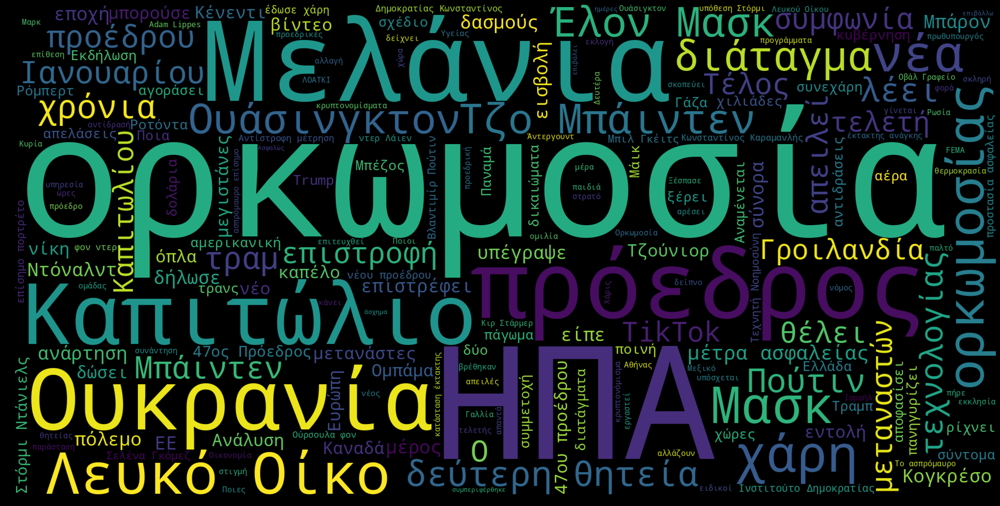

In [ ]:
create_wordcloud_img(jan_text)

In [ ]:
# # προσθήκη πολλών λέξεων στα stopwords (αν δεν υπάρχουν ήδη)
custom_stopwords = {'εκλογές',"Τζο" 'Κούβα', 'πολιτική',"Τραμπ","Ντόναλντ"}

for word in custom_stopwords:
   if word not in nlp.Defaults.stop_words:
     nlp.Defaults.stop_words.add(word)
     lex_attr = nlp.vocab[word]
     lex_attr.is_stop = True

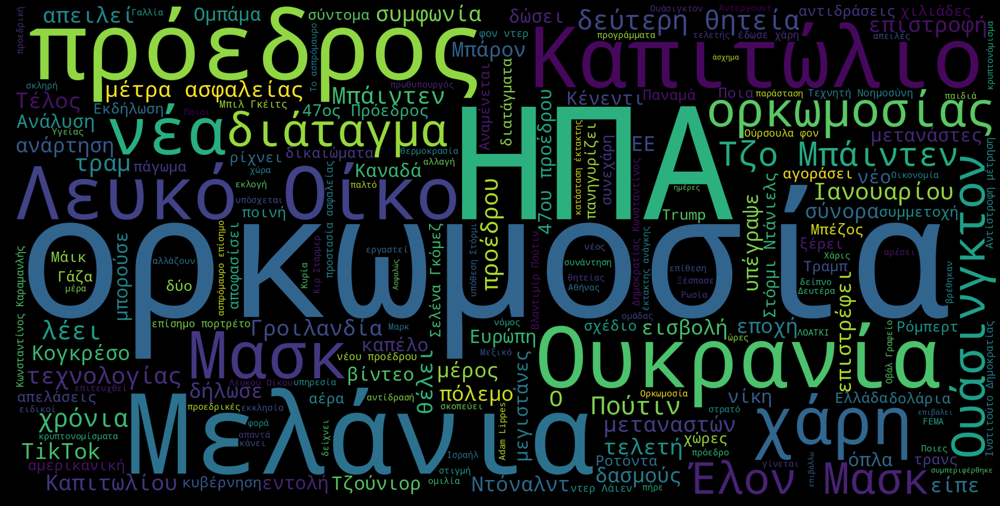

In [ ]:
create_wordcloud_img(jan_text)

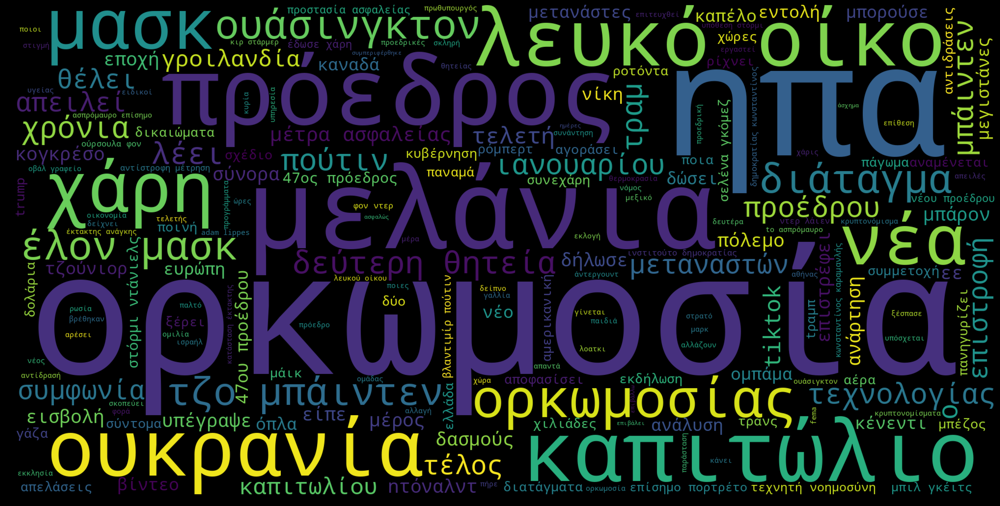

In [ ]:
jan_text_lower = jan_text.lower()
create_wordcloud_img(jan_text_lower)

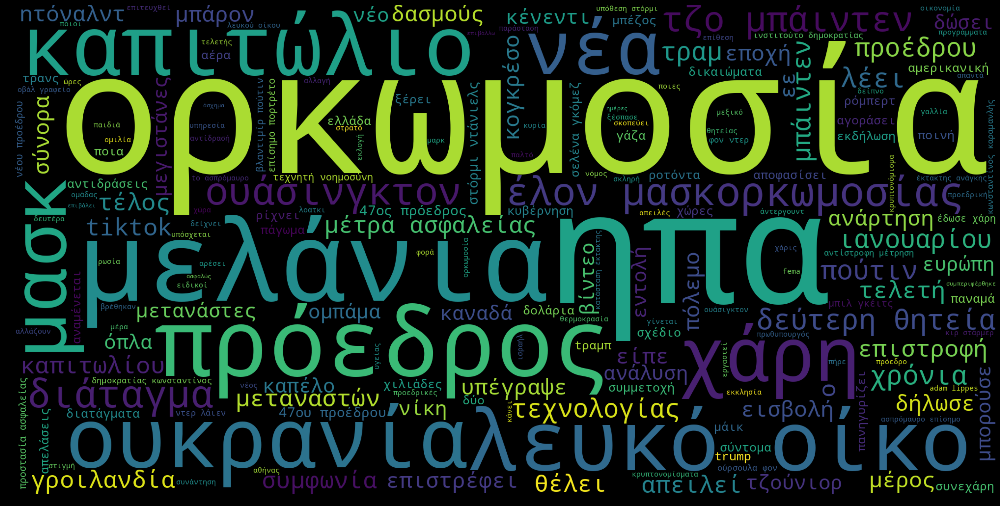

In [ ]:
jan_text_lower = jan_text_lower.replace("ορκομωσία", "ορκομωσίας")
create_wordcloud_img(jan_text_lower)

In [ ]:
# φτιάχνουμε ένα document (με tokens) περνώντας το jan_text_lower από το μοντέλο nlp
# tokens είναι μονάδες κειμένου που προκύπτουν όταν "σπάμε" ένα κείμενο σε μικρότερα κομμάτια — συνήθως λέξεις, σημεία στίξης ή αριθμοί
jan_doc = nlp(jan_text_lower)

# ας δούμε μερικά tokens και την αναγνώριση του μέρους του λόγου (part of speech: pos) που κάνει το γλωσικό μας μοντέλο
for token in jan_doc[:10]:
    print(f"{token.text} -> {token.lemma_} ({token.pos_})")

τραμπ -> τραμπ (NOUN)
: -> : (PUNCT)
ασφαλώς -> ασφαλώς (ADV)
και -> και (CCONJ)
θα -> θα (AUX)
επιβάλλω -> επιβάλλω (VERB)
δασμούς -> δασμός (ADJ)
στην -> σε ο (ADP)
εε -> εε (NOUN)
, -> , (PUNCT)


In [ ]:
# λημματοποιούμε όλο το κείμενο από τα άρθρα του Ιανουαρίου
tokenized_jan_doc = ' '.join(token.lemma_ for token in jan_doc)

In [ ]:
# ας δούμε ένα τμήμα του κειμένου μας
# πώς είναι κανονικά στα άρθρα
print(jan_text[:200])
# πώς το έκανε η λημματοποίηση
print(tokenized_jan_doc[:200])

Τραμπ: Ασφαλώς και θα επιβάλλω δασμούς στην ΕΕ, μας συμπεριφέρθηκε πολύ άσχημα. Τραμπ: Ασφαλώς και θα επιβάλλω δασμούς στην ΕΕ - Η ΕΕ μας συμπεριφέρθηκε πολύ άσχημα είπε μιλώντας σε δημοσιογράφους o π
τραμπ : ασφαλώς και θα επιβάλλω δασμός σε ο εε , εγώ συμπεριφέρθηκε πολύ άσχημα . τραμπ : ασφαλώς και θα επιβάλλω δασμός σε ο εε - ο εε εγώ συμπεριφέρθηκε πολύ άσχημα λέγω μιλώ σε δημοσιογράφος o πρόε


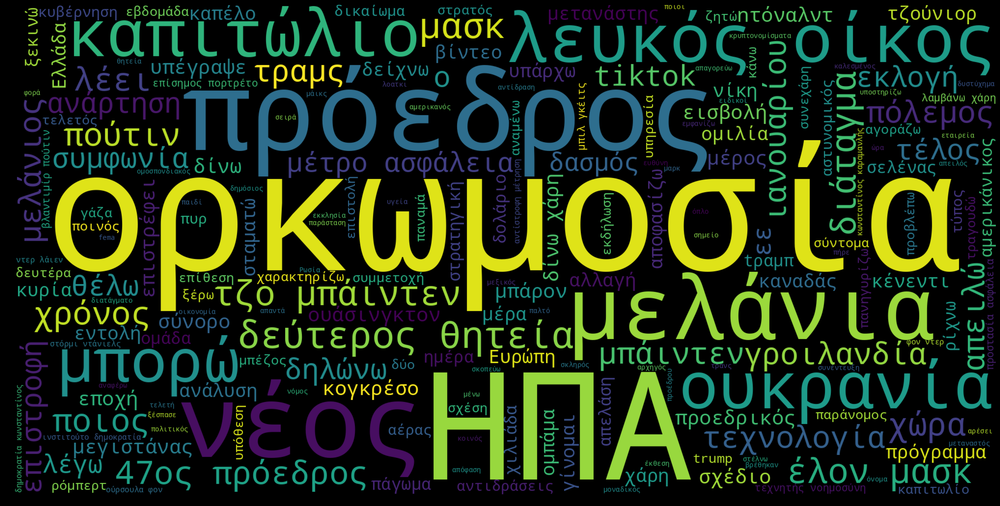

In [ ]:
create_wordcloud_img(tokenized_jan_doc)

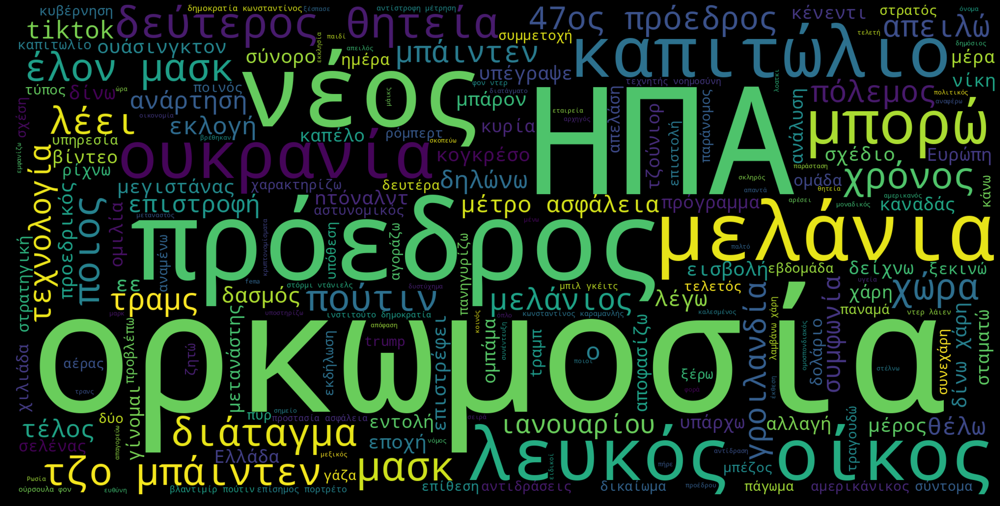

In [ ]:
# ας αφαιρέσουμε και το "τροχαίος" (που προέκυψε από τη λημματοποίηση της λέξης "τροχαία")
# προσθήκη λέξης στα stopwords
nlp.Defaults.stop_words.add("αμερικανικός")
create_wordcloud_img(tokenized_jan_doc)

Αν θέλουμε, μπορούμε να πάρουμε τις λέξεις και τις σχετικές συχνότητές τους σε dataframe.

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

{'ορκωμοσία': 1.0, 'ΗΠΑ': 0.7654320987654321, 'πρόεδρος': 0.37037037037037035, 'νέος': 0.30864197530864196, 'μελάνια': 0.2222222222222222, 'λευκός οίκος': 0.18518518518518517, 'καπιτώλιο': 0.1728395061728395, 'ουκρανία': 0.1728395061728395, 'μπορώ': 0.14814814814814814, 'δεύτερος θητεία': 0.14814814814814814, 'μασκ': 0.13580246913580246, 'διάταγμα': 0.12345679012345678, 'έλον μασκ': 0.12345679012345678, 'τζο μπάιντεν': 0.12345679012345678, 'χρόνος': 0.1111111111111111, 'χώρα': 0.1111111111111111, 'ποιος': 0.1111111111111111, 'λέει': 0.1111111111111111, 'πούτιν': 0.1111111111111111, '47ος πρόεδρος': 0.1111111111111111, 'πόλεμος': 0.09876543209876543, 'μελάνιος': 0.09876543209876543, 'απειλώ': 0.09876543209876543, 'μπάιντεν': 0.09876543209876543, 'τραμς': 0.09876543209876543, 'τεχνολογία': 0.09876543209876543, 'γροιλανδία': 0.09876543209876543, 'ιανουαρίου': 0.09876543209876543, 'o': 0.08641975308641975, 'επιστροφή': 0.08641975308641975, 'δηλώνω': 0.08641975308641975, 'τέλος': 0.08641975

In [ ]:
wc_df = pd.DataFrame(frequencies.items(), columns=["λέξη", "σχετική συχνότητα"])
wc_df

,λέξη,σχετική συχνότητα
0,ορκωμοσία,1.000000
1,ΗΠΑ,0.765432
2,πρόεδρος,0.370370
3,νέος,0.308642
4,μελάνια,0.222222
...,...,...
195,παλτό,0.037037
196,παράσταση,0.037037
197,τελετή,0.037037
198,ώρα,0.037037


**Bonus Tip**:

Από τη στιγμή που έχουμε εφαρμόσει στο κείμενό μας το γλωσσικό μοντέλο (nlp), μπορούμε εύκολα να βρούμε Named Entities, να κάνουμε δηλαδή Named Entity Recognition (NER) με το spaCy.

In [ ]:
jan_doc.ents

(τραμπ,
 τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 tραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 χαμάς,
 ηπα,
 τραμπ,
 τραμπ,
 λοατκι+,
 τραμπ,
 τραμπ,
 ηπα,
 τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 σλοβακία,
 τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ευρώπη,
 τραμπ,
 τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ τραμπ,
 ντόναλντ τραμπ,
 νέιτ,
 ηπα,
 τραμπ,
 ηπα,
 τραμπ,
 ηπα,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 ελλάδα,
 tραμπ,
 tραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 τραμπ,
 ντόν

In [ ]:
for ent in jan_doc.ents:
  print(ent.text, ent.label_)

τραμπ PERSON
τραμπ PERSON
ηπα GPE
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ηπα GPE
ηπα GPE
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
tραμπ PERSON
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
χαμάς ORG
ηπα GPE
τραμπ PERSON
τραμπ PERSON
λοατκι+ ORG
τραμπ PERSON
τραμπ PERSON
ηπα GPE
τραμπ PERSON
ηπα GPE
τραμπ PERSON
τραμπ PERSON
σλοβακία GPE
τραμπ PERSON
ντόναλντ τραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
ευρώπη GPE
τραμπ PERSON
τραμπ PERSON
ηπα GPE
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
ντόναλντ τραμπ PERSON
ντόναλντ τραμπ PERSON
ντόναλντ τραμπ PERSON
ηπα GPE
τραμπ PERSON
ηπα GPE
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ηπα GPE
ηπα GPE
ντόναλντ τραμπ PERSON
τραμπ PERSON
τραμπ τραμπ PERSON
ντόναλντ τραμπ PERSON
νέιτ PE